In [1]:
# Utility tool to construct UNet
!pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-o20u1ibc
  Running command git clone -q https://github.com/tensorflow/examples.git /tmp/pip-req-build-o20u1ibc
  Created wheel for tensorflow-examples: filename=tensorflow_examples-3378631ec6e02e49fbbb87e4756b230c4106b9e4_-py3-none-any.whl size=269152 sha256=9f20a4ef0a55dde96d6f2a1af4dfe7edee1f077cacda46f5ba95272ae9c1580a
  Stored in directory: /tmp/pip-ephem-wheel-cache-rjqrsf92/wheels/eb/19/50/2a4363c831fa12b400af86325a6f26ade5d2cdc5b406d552ca
Failed to build tensorflow-examples
    Running setup.py install for tensorflow-examples ... done
  DEPRECATION: tensorflow-examples was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [2]:
# Module to get variable name as str
!pip3 install varname

In [3]:
!pip install -U tensorboard

In [4]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
# Reload TensorBoard
# %reload_ext tensorboard


In [5]:
from datetime import datetime as dt
from requests import get
import os

from varname import argname
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder, RobustScaler
from sklearn.model_selection import train_test_split
from google.colab import drive
from scipy import io
from sklearn.model_selection import train_test_split
from tensorflow_examples.models.pix2pix import pix2pix
import cv2
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn
import zipfile

# Load data


The dataset is already split into train and test set. So our dataset preparation workflow for this notebook would be:
- Load all images and masks from train and test folders.
- Further split train set into train and validation sets with ratio of 80:20.
- Perform preprocessing on all train/validation/test sets.
  - Convert to numpy array
  - Expand masks dimension
  - Normalize images
  - Convert into tensor slice
  - Zip tensor slice so that each sets contains both the images and the masks together
  - Convert into prefetch dataset

```
```
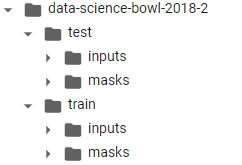

In [6]:
!wget no-check-certificate \
    "https://github.com/SarahHannes/data-science-bowl-2018/raw/main/data/data-science-bowl-2018.zip" \
    -O "/content/data-science-bowl-2018.zip"

--2022-04-16 15:28:19--  http://no-check-certificate/
Resolving no-check-certificate (no-check-certificate)... failed: Name or service not known.
wget: unable to resolve host address ‘no-check-certificate’
--2022-04-16 15:28:19--  https://github.com/SarahHannes/data-science-bowl-2018/raw/main/data/data-science-bowl-2018.zip
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/SarahHannes/data-science-bowl-2018/main/data/data-science-bowl-2018.zip [following]
--2022-04-16 15:28:19--  https://raw.githubusercontent.com/SarahHannes/data-science-bowl-2018/main/data/data-science-bowl-2018.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, a

In [7]:
# Extract dataset from zip to current session
zip_ref = zipfile.ZipFile('/content/data-science-bowl-2018.zip', 'r') # Opens the zip file in read mode
zip_ref.extractall('/content')
zip_ref.close()

### Load training images and masks


In [8]:
IMG_SIZE = (128, 128)
train_images = []
train_masks = []
train_directory = '/content/data-science-bowl-2018-2/train'

In [9]:
# read all images and convert to RGB
image_dir = os.path.join(train_directory, 'inputs')
for image_file in sorted(os.listdir(image_dir)):
  img = cv2.imread(os.path.join(image_dir, image_file))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, IMG_SIZE)
  train_images.append(img)

In [10]:
print('Total train images:', len(train_images))

Total train images: 603


In [11]:
# read all masks and convert to grayscale
mask_dir = os.path.join(train_directory, 'masks')
for mask_file in sorted(os.listdir(mask_dir)):
  mask = cv2.imread(os.path.join(mask_dir, mask_file), cv2.IMREAD_GRAYSCALE)
  mask = cv2.resize(mask, IMG_SIZE)
  train_masks.append(mask)

In [ ]:
print('Total train masks:', len(train_masks))

Total train masks: 603


### Load testing images and masks

In [12]:
test_images = []
test_masks = []
test_directory = '/content/data-science-bowl-2018-2/test'

In [13]:
# read all images and convert to RGB
image_dir = os.path.join(test_directory, 'inputs')
for image_file in sorted(os.listdir(image_dir)):
  img = cv2.imread(os.path.join(image_dir, image_file))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, IMG_SIZE)
  test_images.append(img)

In [ ]:
print('Total test images:', len(test_images))

Total test images: 67


In [15]:
test_images[0].shape

(128, 128, 3)

In [14]:
# read all masks and convert to grayscale
mask_dir = os.path.join(test_directory, 'masks')
for mask_file in sorted(os.listdir(mask_dir)):
  mask = cv2.imread(os.path.join(mask_dir, mask_file), cv2.IMREAD_GRAYSCALE)
  mask = cv2.resize(mask, IMG_SIZE)
  test_masks.append(mask)

In [16]:
print('Total train masks:', len(test_masks))

Total train masks: 67


In [ ]:
test_masks[0].shape

(128, 128)

### Convert images and masks into numpy array

In [17]:
# Train set
train_images_np = np.array(train_images)
train_masks_np = np.array(train_masks)

# Test set
test_images_np = np.array(test_images)
test_masks_np = np.array(test_masks)

### Visualize data

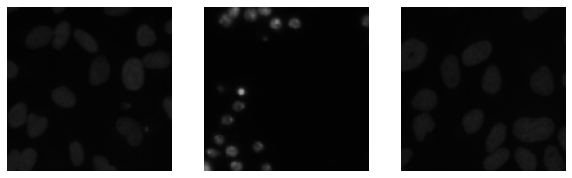

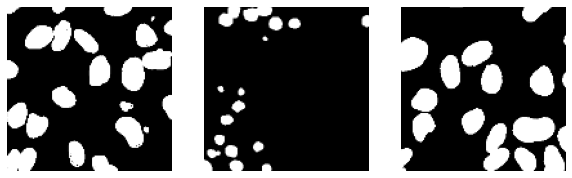

In [18]:
# Plot a few images from training set
plt.figure(figsize=(10,4))
for i in range(1, 4):
  plt.subplot(1, 3, i)
  img_plot = test_images[i]
  plt.imshow(img_plot)
  plt.axis('off')

plt.show()

plt.figure(figsize=(10,4))
for i in range(1, 4):
  plt.subplot(1, 3, i)
  mask_plot = test_masks[i]
  plt.imshow(mask_plot, cmap='gray')
  plt.axis('off')

plt.show()

# Preprocess data

### Expand mask dimension

In [19]:
# Expanding masks in the last axis
# Train set
train_mask_np_expand = np.expand_dims(train_masks_np, axis=-1)
print(train_masks[0].min(), train_masks[0].max())

# Test set
test_mask_np_expand = np.expand_dims(test_masks_np, axis=-1)
print(test_masks[0].min(), test_masks[0].max())

0 255
0 255


### Change masks value
- To normalize value
- To encode into numeraical encoding

In [20]:
# Train set
train_converted_masks = np.round(train_mask_np_expand/ 255)
# To get background pixels as 1, and cells pixels as 0
train_converted_masks = 1 - train_converted_masks

# Test set
test_converted_masks = np.round(test_mask_np_expand/ 255)
# To get background pixels as 1, and cells pixels as 0
test_converted_masks = 1 - test_converted_masks

### Normalize images

In [21]:
# Train set
train_converted_images = train_images_np/ 255.0

# Test set
test_converted_images = test_images_np/ 255.0

### Split train set into train and validation sets

In [22]:
X_train, X_val, y_train, y_val = train_test_split(train_converted_images, train_converted_masks, test_size=0.2, random_state=0)

### Convert numpy array into tensor slice


In [23]:
# Train set
X_train_ts = tf.data.Dataset.from_tensor_slices(X_train)
y_train_ts = tf.data.Dataset.from_tensor_slices(y_train)

# Validation set
X_val_ts = tf.data.Dataset.from_tensor_slices(X_val)
y_val_ts = tf.data.Dataset.from_tensor_slices(y_val)

# Test set
X_test_ts = tf.data.Dataset.from_tensor_slices(test_converted_images)
y_test_ts = tf.data.Dataset.from_tensor_slices(test_converted_masks)

### Zip tensor slice from dataset

so that each sets contains both the images and the masks together

In [24]:
# zip so that the dataset contains the feature and label together
train = tf.data.Dataset.zip((X_train_ts, y_train_ts))
val = tf.data.Dataset.zip((X_val_ts, y_val_ts))
test = tf.data.Dataset.zip((X_test_ts, y_test_ts))

### Convert into prefetch dataset

In [ ]:
print('Lenth of train', len(X_train_ts))
print('Lenth of val',len(X_val_ts))
print('Lenth of test',len(X_test_ts))

Lenth of train 482
Lenth of val 121
Lenth of test 67


In [25]:
BATCH_SIZE = 16
AUTOTUNE = tf.data.AUTOTUNE
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = len(X_train_ts)//BATCH_SIZE
VALIDATION_STEPS = len(X_test_ts)//BATCH_SIZE

In [26]:
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train = train.prefetch(buffer_size = AUTOTUNE)
val = val.batch(BATCH_SIZE).repeat()
val = val.prefetch(buffer_size = AUTOTUNE)
test = test.batch(BATCH_SIZE).prefetch(buffer_size = AUTOTUNE)

In [ ]:
print('shape of prefetch dataset: ')
print('Input image shape:', train.element_spec[0])
print('Output mask shape:', train.element_spec[1])

shape of prefetch dataset: 
Input image shape: TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float64, name=None)
Output mask shape: TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float64, name=None)


# Build model

In [27]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128,128,3],include_top=False)

# Use the activations of those layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]

9420800/9406464 [==============================] - 0s 0us/step


In [28]:
# To list all layers and the output shapes
base_model.summary()

Model: "mobilenetv2_1.00_128"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 64, 64, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 64, 64, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 64, 64, 32)   0           ['bn_Conv1[0][

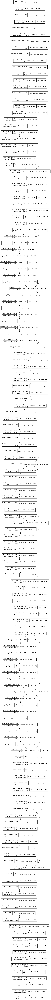

In [29]:
# Plot base model
tf.keras.utils.plot_model(base_model, show_shapes=True)

In [30]:
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

# Freeze the downsampling layers
down_stack.trainable = False

### Create upsampling stack

In [58]:
def unet_model(output_channels):
  """
  Create modified uNet.
  """
  inputs = tf.keras.layers.Input(shape=[IMG_SIZE[0], IMG_SIZE[1], 3])

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      filters=output_channels, kernel_size=3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [32]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]


In [59]:
OUTPUT_CLASSESS = 2 # one hot encoding output
model = unet_model(output_channels=OUTPUT_CLASSESS)

In [34]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             [(None, 64, 64, 96)  1841984     ['input_2[0][0]']                
                                , (None, 32, 32, 14                                               
                                4),                                                               
                                 (None, 16, 16, 192                                               
                                ),                                                          

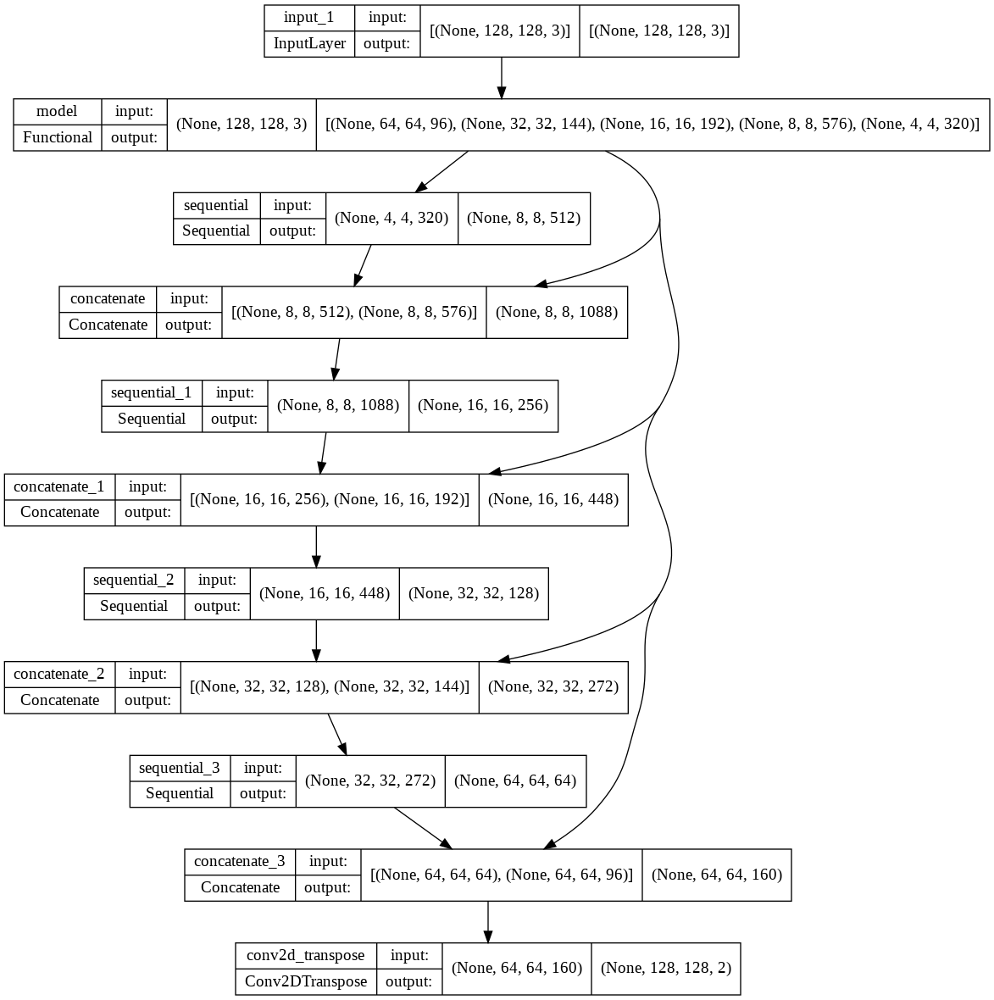

In [60]:
tf.keras.utils.plot_model(model, show_shapes=True)

# Compile model

In [36]:
def display(display_list):
  """
  Display input image, true mask and predicted mask.
  """
  plt.figure(figsize=(15,15))
  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

def create_mask(pred_mask):
  """
  Process predicted mask.
  """
  # the pred_mask will only be 1 channel because of axis argument
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask

def show_predictions(dataset=None, total_batch=1):
  """
  Show the predicted result along with its input image and true mask.
  """
  if dataset:
    for image, mask in dataset.take(total_batch):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)[0]])
  else:
    for images, masks in train.take(2):
      sample_image, sample_mask = images[0], masks[0]
      display([sample_image, sample_mask, create_mask(model.predict(sample_image[tf.newaxis, ...]))[0]])

In [37]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    """
    Custom callback to display result during training.
    """
    # clear_output(wait=True)
    show_predictions()
    print('\n Sample prediction after epoch {}\n'.format(epoch+1))

In [38]:
# Get the current filename of the colab notebook
notebook_filename = get('http://172.28.0.2:9000/api/sessions').json()[0]['name']
notebook_name = notebook_filename.split('.')[0]
print('notebook_filename:', notebook_filename)
print('notebook_name:', notebook_name)

print()

# Create path to store the checkpoints from this notebook
gdrive_root_dir = '/content/drive/MyDrive/mida_deep_learning/checkpoints'
checkpoint_dir = os.path.join(gdrive_root_dir, notebook_name)
print('Root directory in google drive:', gdrive_root_dir)
print('Folder to save checkpoints in:', checkpoint_dir)

notebook_filename: data_science_bowl_2018_mobilenetv2.ipynb
notebook_name: data_science_bowl_2018_mobilenetv2

Root directory in google drive: /content/drive/MyDrive/mida_deep_learning/checkpoints
Folder to save checkpoints in: /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2


In [39]:
def train_model(model, epochs=20):
  """
  Train model.
  """

  # need to output logits since the output layer does not have any activation
  model.compile(optimizer='adam',
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])
  
  # Initialize checkpoint
  # Create folder if not yet exist
  os.makedirs(checkpoint_dir, exist_ok=True)
  filepath = os.path.join(checkpoint_dir, argname('model'), "weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5")
  checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

  # Initialize earlystopping
  earlystopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=2)
  
  # Initialize tensorboard
  logdir = os.path.join("logs", argname('model'))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

  return model.fit(train,
                   validation_data=val,
                   epochs=epochs,
                   steps_per_epoch=STEPS_PER_EPOCH,
                   validation_steps=VALIDATION_STEPS,
                   callbacks=[DisplayCallback(), checkpoint_callback, tensorboard_callback, earlystopping_callback])

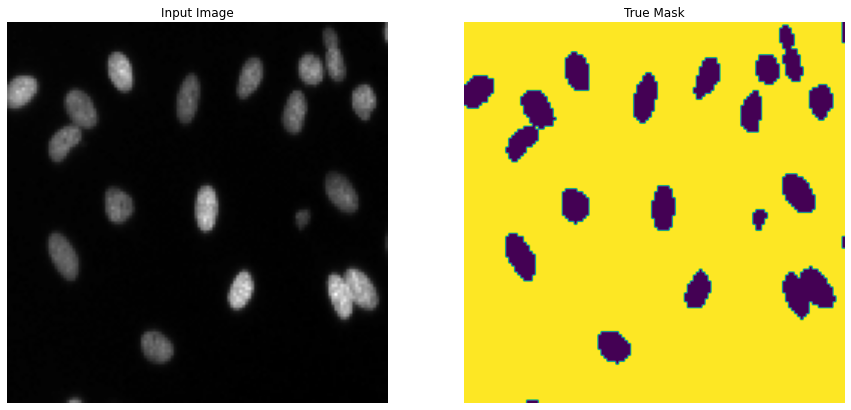

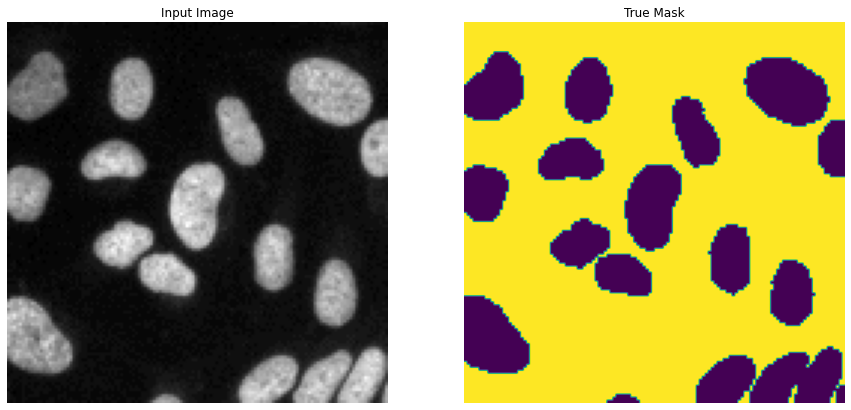

In [40]:
# Display some examples before training
for images, masks in train.take(2):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])

# Train model

In [41]:
tf.keras.backend.clear_session()

Epoch 1/100
30/30 [==============================] - ETA: 0s - loss: 0.3747 - accuracy: 0.8190

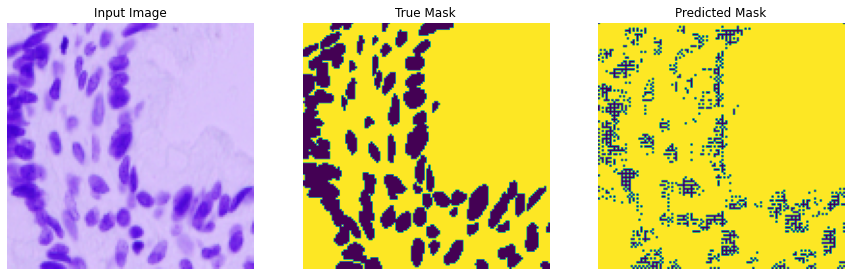

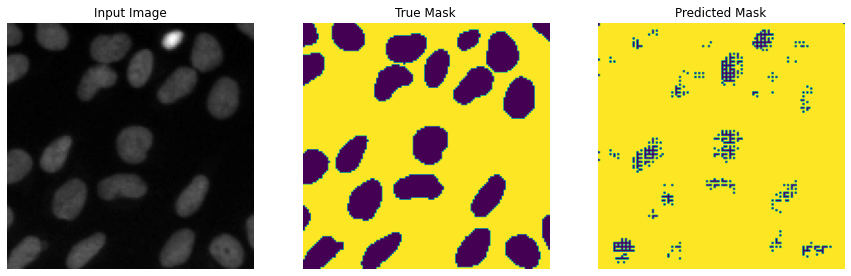


 Sample prediction after epoch 1


Epoch 1: val_accuracy improved from -inf to 0.90126, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-01-0.90.hdf5
30/30 [==============================] - 53s 2s/step - loss: 0.3747 - accuracy: 0.8190 - val_loss: 0.2210 - val_accuracy: 0.9013
Epoch 2/100
30/30 [==============================] - ETA: 0s - loss: 0.1721 - accuracy: 0.9280

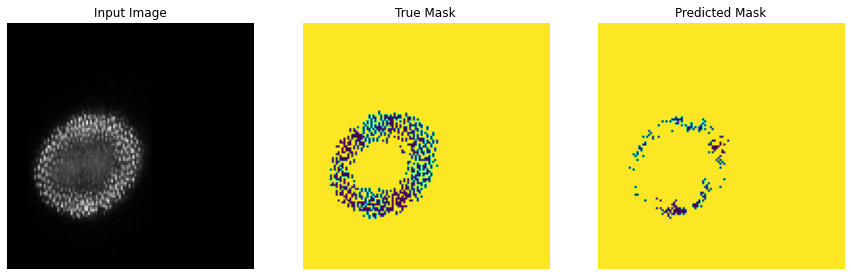

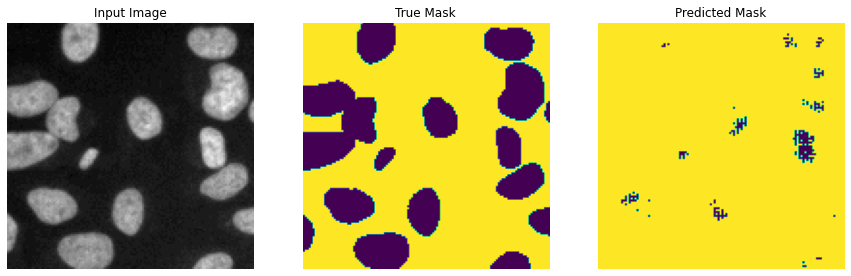


 Sample prediction after epoch 2


Epoch 2: val_accuracy improved from 0.90126 to 0.92012, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-02-0.92.hdf5
30/30 [==============================] - 47s 2s/step - loss: 0.1721 - accuracy: 0.9280 - val_loss: 0.1628 - val_accuracy: 0.9201
Epoch 3/100
30/30 [==============================] - ETA: 0s - loss: 0.1341 - accuracy: 0.9456

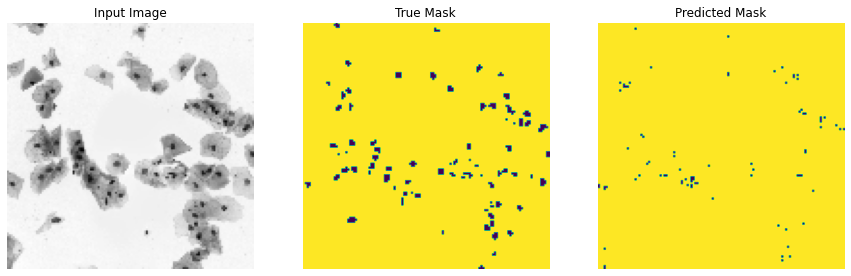

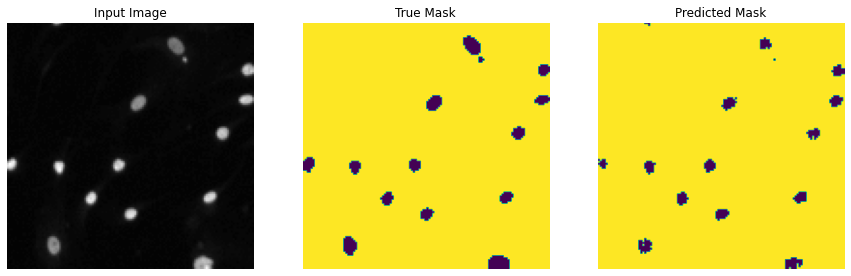


 Sample prediction after epoch 3


Epoch 3: val_accuracy improved from 0.92012 to 0.92470, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-03-0.92.hdf5
30/30 [==============================] - 46s 2s/step - loss: 0.1341 - accuracy: 0.9456 - val_loss: 0.1544 - val_accuracy: 0.9247
Epoch 4/100
30/30 [==============================] - ETA: 0s - loss: 0.1199 - accuracy: 0.9511

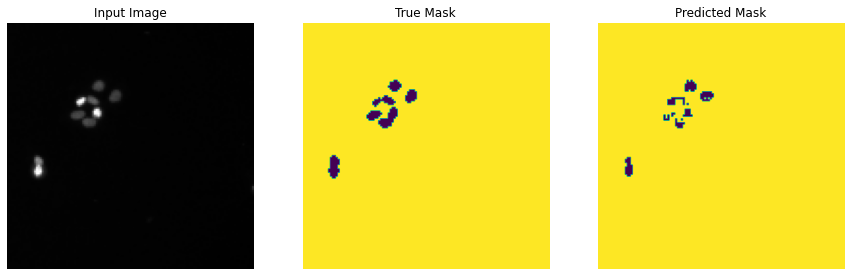

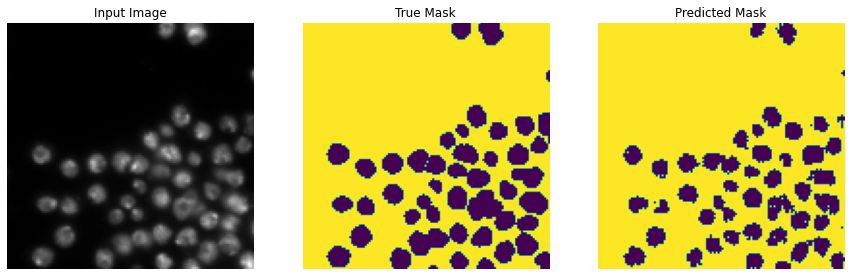


 Sample prediction after epoch 4


Epoch 4: val_accuracy improved from 0.92470 to 0.94205, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-04-0.94.hdf5
30/30 [==============================] - 50s 2s/step - loss: 0.1199 - accuracy: 0.9511 - val_loss: 0.1303 - val_accuracy: 0.9420
Epoch 5/100
30/30 [==============================] - ETA: 0s - loss: 0.1127 - accuracy: 0.9537

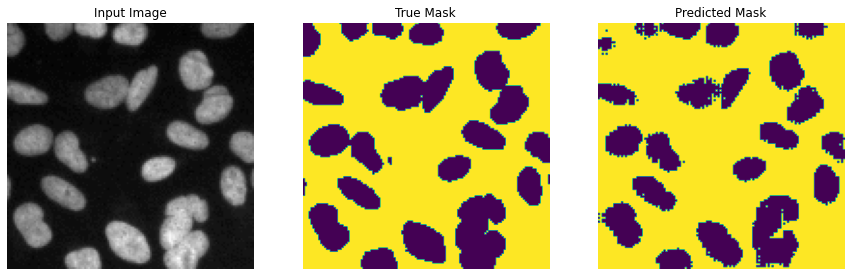

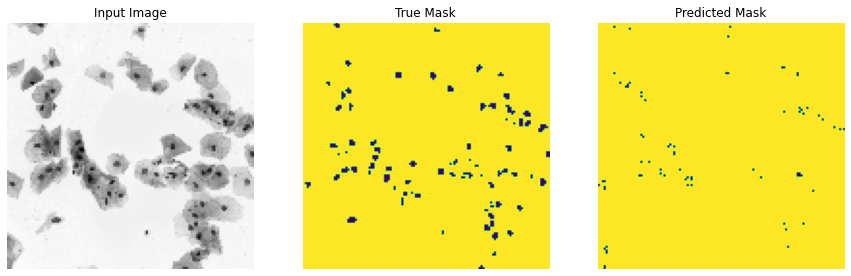


 Sample prediction after epoch 5


Epoch 5: val_accuracy improved from 0.94205 to 0.95166, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-05-0.95.hdf5
30/30 [==============================] - 49s 2s/step - loss: 0.1127 - accuracy: 0.9537 - val_loss: 0.1162 - val_accuracy: 0.9517
Epoch 6/100
30/30 [==============================] - ETA: 0s - loss: 0.1073 - accuracy: 0.9560

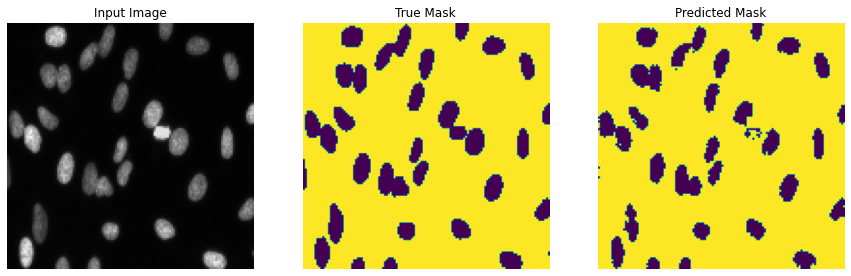

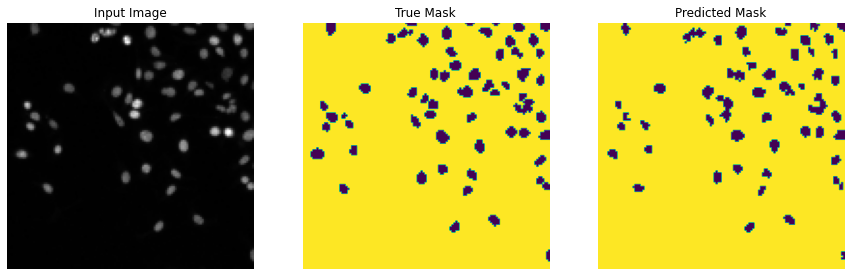


 Sample prediction after epoch 6


Epoch 6: val_accuracy improved from 0.95166 to 0.95569, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-06-0.96.hdf5
30/30 [==============================] - 46s 2s/step - loss: 0.1073 - accuracy: 0.9560 - val_loss: 0.1050 - val_accuracy: 0.9557
Epoch 7/100
30/30 [==============================] - ETA: 0s - loss: 0.1041 - accuracy: 0.9576

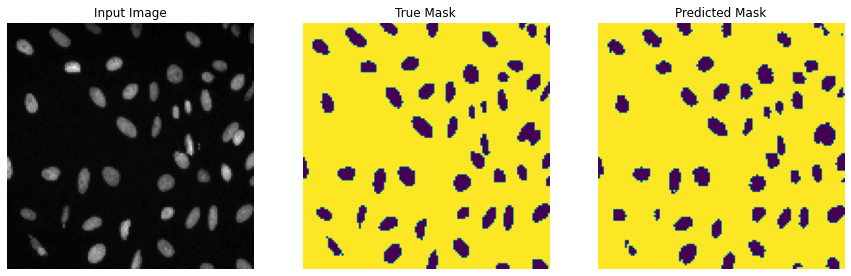

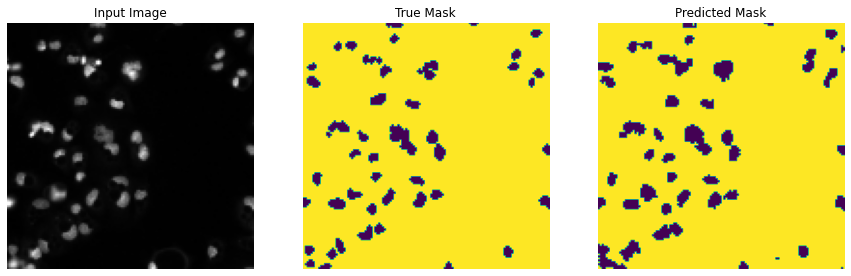


 Sample prediction after epoch 7


Epoch 7: val_accuracy improved from 0.95569 to 0.96221, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-07-0.96.hdf5
30/30 [==============================] - 49s 2s/step - loss: 0.1041 - accuracy: 0.9576 - val_loss: 0.0958 - val_accuracy: 0.9622
Epoch 8/100
30/30 [==============================] - ETA: 0s - loss: 0.1082 - accuracy: 0.9559

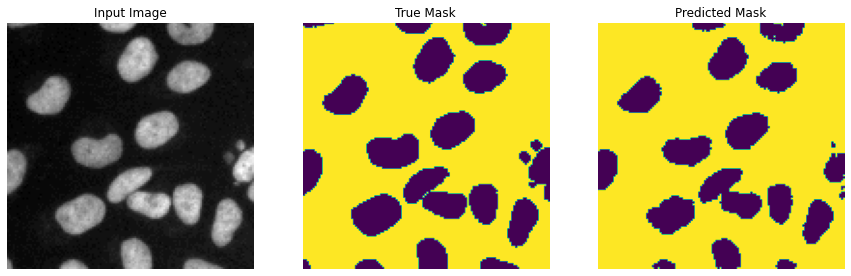

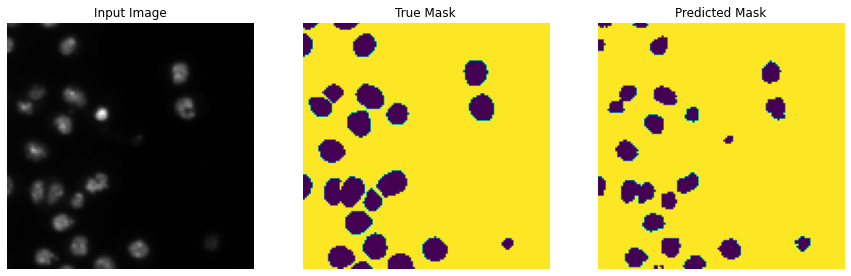


 Sample prediction after epoch 8


Epoch 8: val_accuracy did not improve from 0.96221
30/30 [==============================] - 49s 2s/step - loss: 0.1082 - accuracy: 0.9559 - val_loss: 0.0977 - val_accuracy: 0.9591
Epoch 9/100
30/30 [==============================] - ETA: 0s - loss: 0.0907 - accuracy: 0.9633

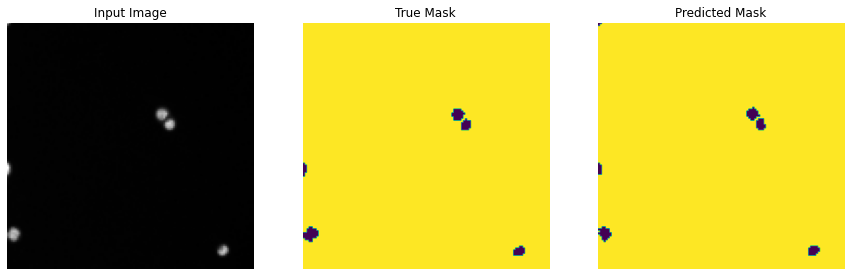

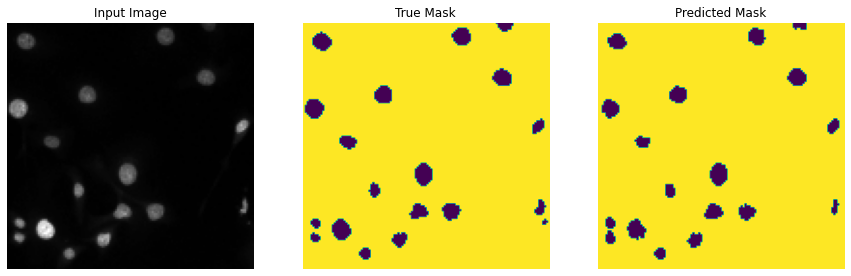


 Sample prediction after epoch 9


Epoch 9: val_accuracy improved from 0.96221 to 0.96379, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-09-0.96.hdf5
30/30 [==============================] - 48s 2s/step - loss: 0.0907 - accuracy: 0.9633 - val_loss: 0.0893 - val_accuracy: 0.9638
Epoch 10/100
30/30 [==============================] - ETA: 0s - loss: 0.0929 - accuracy: 0.9617

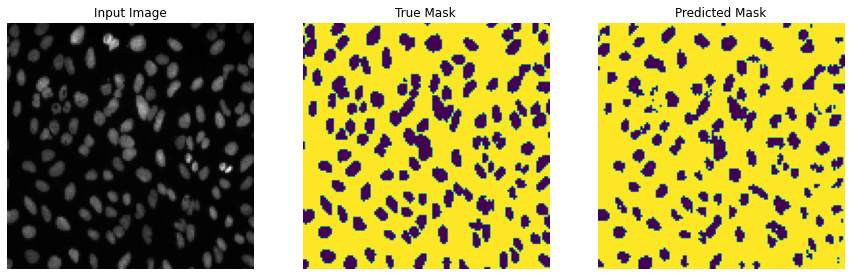

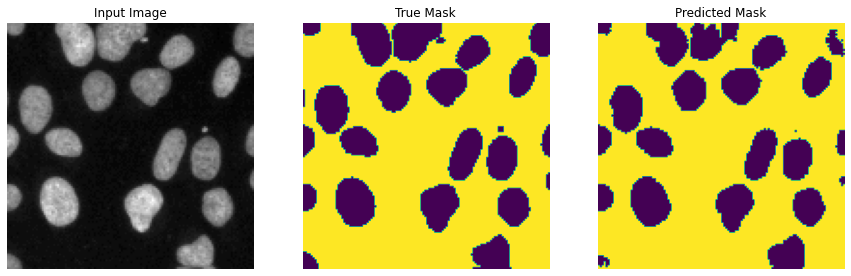


 Sample prediction after epoch 10


Epoch 10: val_accuracy did not improve from 0.96379
30/30 [==============================] - 45s 2s/step - loss: 0.0929 - accuracy: 0.9617 - val_loss: 0.0911 - val_accuracy: 0.9625
Epoch 11/100
30/30 [==============================] - ETA: 0s - loss: 0.1021 - accuracy: 0.9585

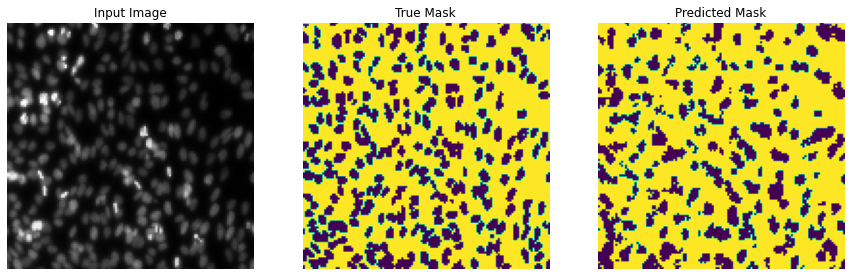

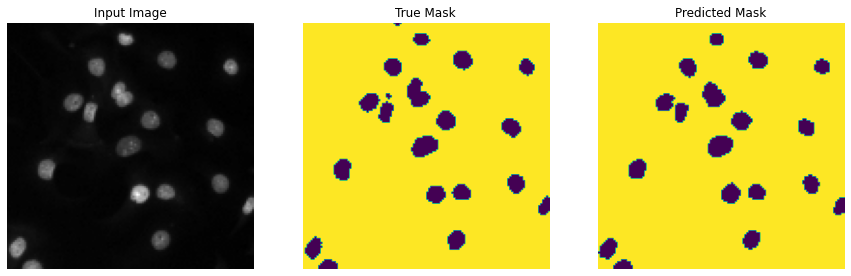


 Sample prediction after epoch 11


Epoch 11: val_accuracy did not improve from 0.96379
30/30 [==============================] - 45s 1s/step - loss: 0.1021 - accuracy: 0.9585 - val_loss: 0.0899 - val_accuracy: 0.9633
Epoch 12/100
30/30 [==============================] - ETA: 0s - loss: 0.0882 - accuracy: 0.9643

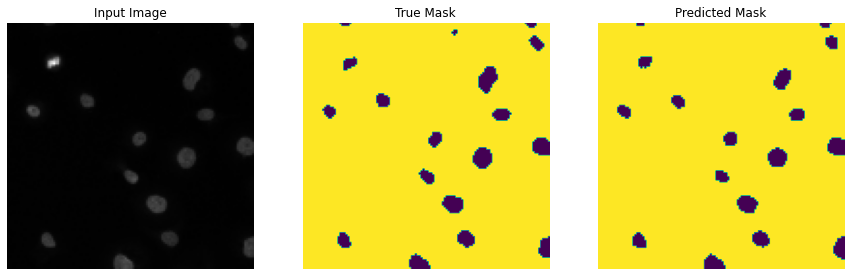

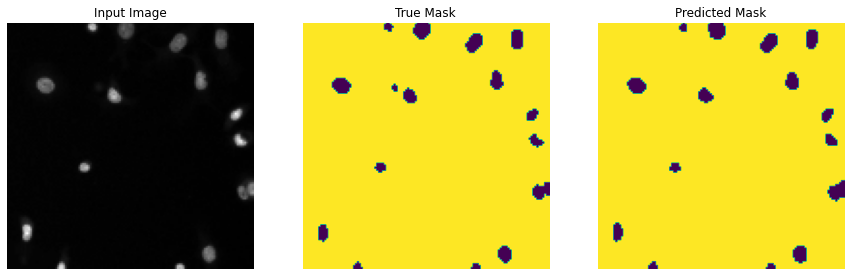


 Sample prediction after epoch 12


Epoch 12: val_accuracy improved from 0.96379 to 0.96446, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-12-0.96.hdf5
30/30 [==============================] - 48s 2s/step - loss: 0.0882 - accuracy: 0.9643 - val_loss: 0.0867 - val_accuracy: 0.9645
Epoch 13/100
30/30 [==============================] - ETA: 0s - loss: 0.0884 - accuracy: 0.9639

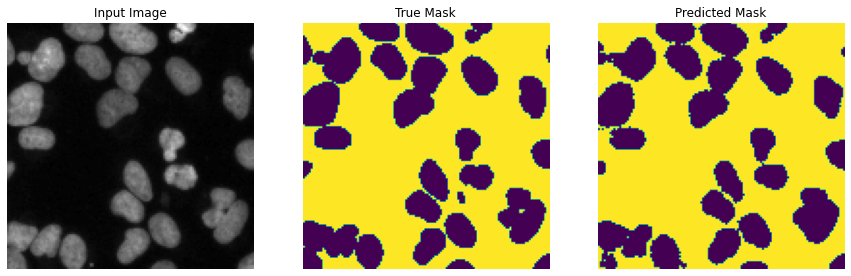

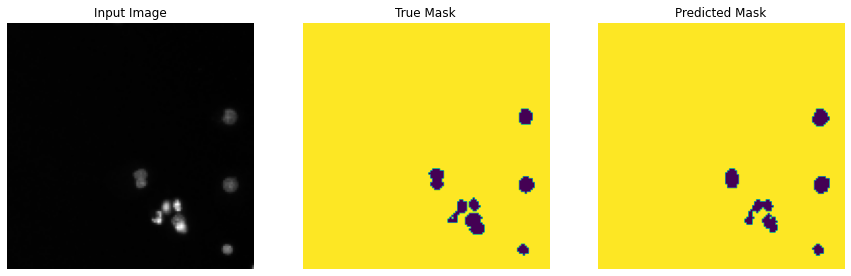


 Sample prediction after epoch 13


Epoch 13: val_accuracy improved from 0.96446 to 0.96487, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-13-0.96.hdf5
30/30 [==============================] - 45s 2s/step - loss: 0.0884 - accuracy: 0.9639 - val_loss: 0.0877 - val_accuracy: 0.9649
Epoch 14/100
30/30 [==============================] - ETA: 0s - loss: 0.0834 - accuracy: 0.9658

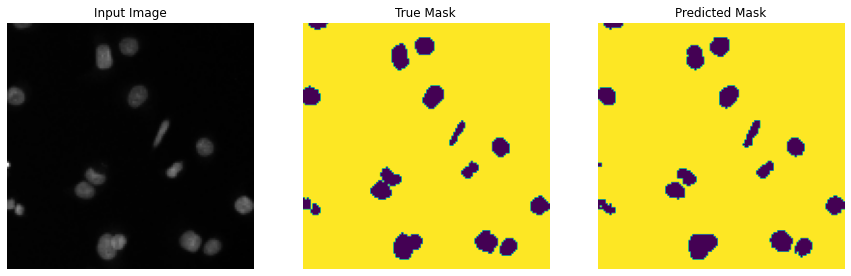

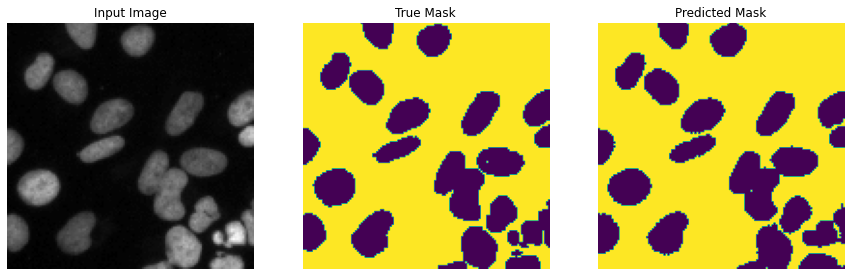


 Sample prediction after epoch 14


Epoch 14: val_accuracy improved from 0.96487 to 0.96688, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-14-0.97.hdf5
30/30 [==============================] - 47s 2s/step - loss: 0.0834 - accuracy: 0.9658 - val_loss: 0.0824 - val_accuracy: 0.9669
Epoch 15/100
30/30 [==============================] - ETA: 0s - loss: 0.0850 - accuracy: 0.9652

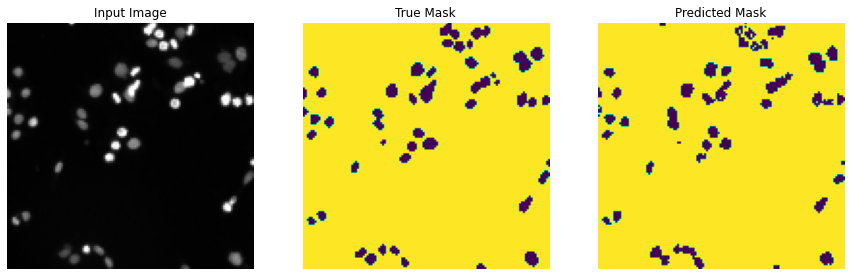

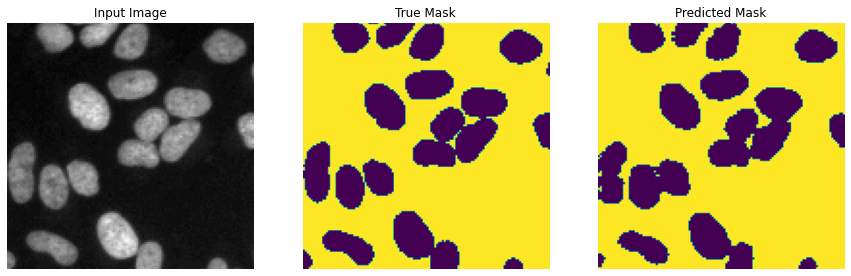


 Sample prediction after epoch 15


Epoch 15: val_accuracy did not improve from 0.96688
30/30 [==============================] - 44s 1s/step - loss: 0.0850 - accuracy: 0.9652 - val_loss: 0.0819 - val_accuracy: 0.9668
Epoch 16/100
30/30 [==============================] - ETA: 0s - loss: 0.0812 - accuracy: 0.9668

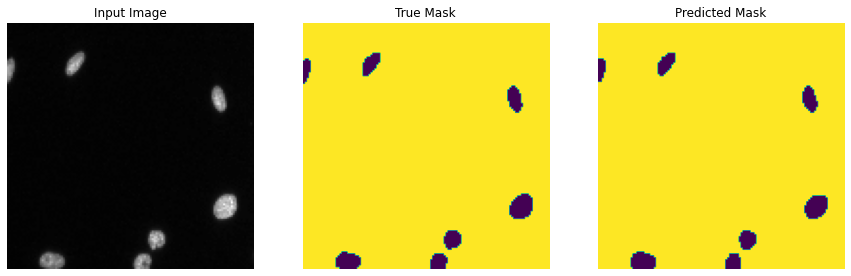

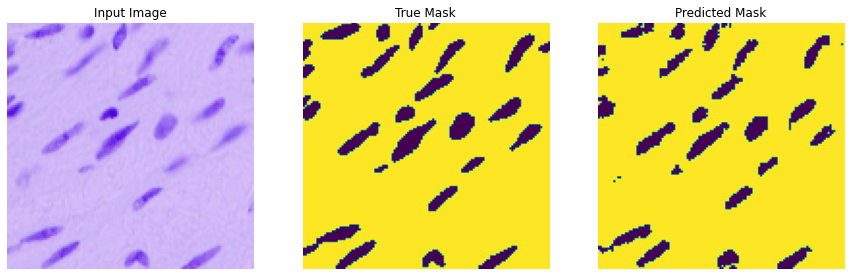


 Sample prediction after epoch 16


Epoch 16: val_accuracy improved from 0.96688 to 0.96703, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-16-0.97.hdf5
30/30 [==============================] - 47s 2s/step - loss: 0.0812 - accuracy: 0.9668 - val_loss: 0.0809 - val_accuracy: 0.9670
Epoch 17/100
30/30 [==============================] - ETA: 0s - loss: 0.0837 - accuracy: 0.9656

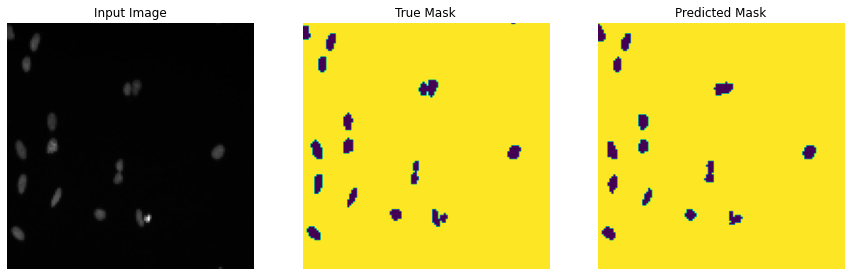

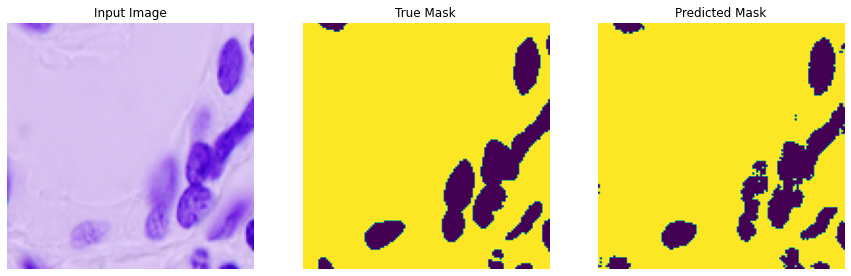


 Sample prediction after epoch 17


Epoch 17: val_accuracy improved from 0.96703 to 0.96762, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-17-0.97.hdf5
30/30 [==============================] - 45s 2s/step - loss: 0.0837 - accuracy: 0.9656 - val_loss: 0.0802 - val_accuracy: 0.9676
Epoch 18/100
30/30 [==============================] - ETA: 0s - loss: 0.0791 - accuracy: 0.9675

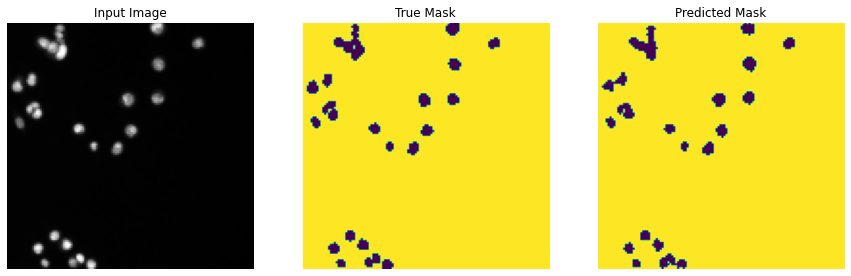

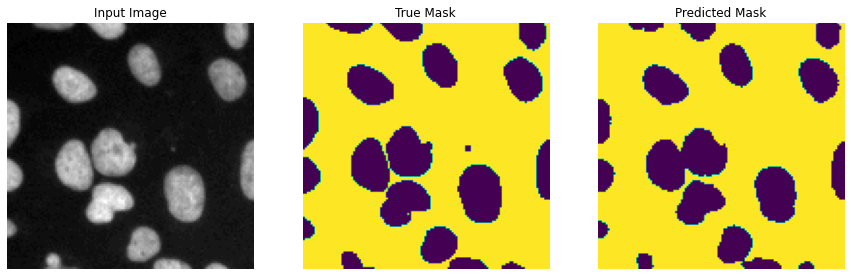


 Sample prediction after epoch 18


Epoch 18: val_accuracy did not improve from 0.96762
30/30 [==============================] - 46s 2s/step - loss: 0.0791 - accuracy: 0.9675 - val_loss: 0.0816 - val_accuracy: 0.9673
Epoch 19/100
30/30 [==============================] - ETA: 0s - loss: 0.0745 - accuracy: 0.9694

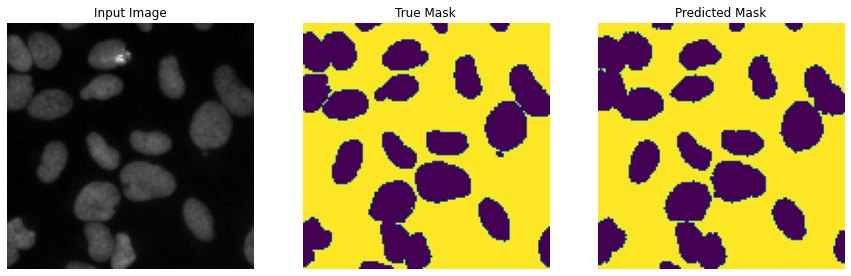

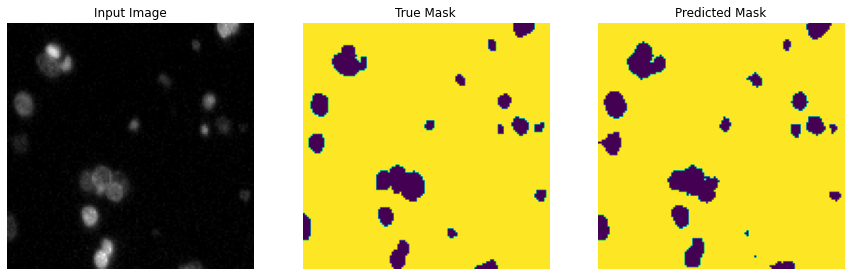


 Sample prediction after epoch 19


Epoch 19: val_accuracy improved from 0.96762 to 0.96804, saving model to /content/drive/MyDrive/mida_deep_learning/checkpoints/data_science_bowl_2018_mobilenetv2/model/weights-improvement-19-0.97.hdf5
30/30 [==============================] - 48s 2s/step - loss: 0.0745 - accuracy: 0.9694 - val_loss: 0.0793 - val_accuracy: 0.9680
Epoch 20/100
30/30 [==============================] - ETA: 0s - loss: 0.0831 - accuracy: 0.9657

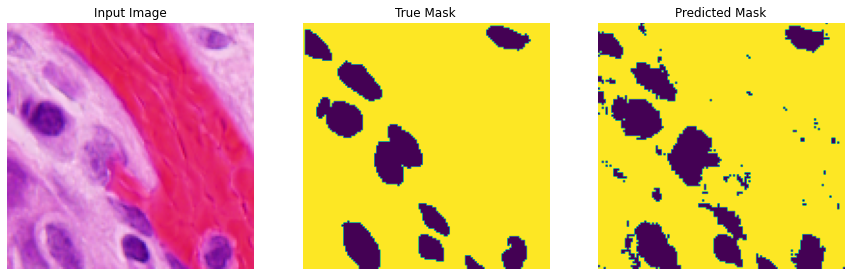

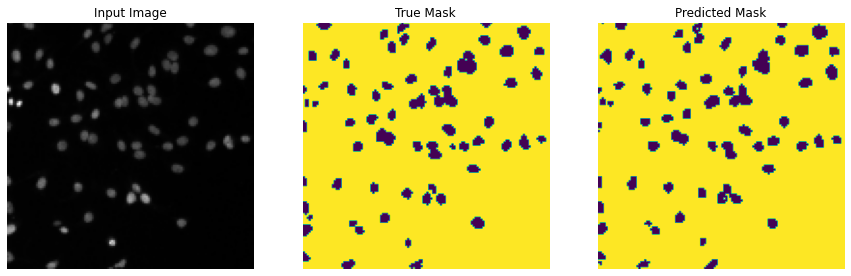


 Sample prediction after epoch 20


Epoch 20: val_accuracy did not improve from 0.96804
30/30 [==============================] - 47s 2s/step - loss: 0.0831 - accuracy: 0.9657 - val_loss: 0.0817 - val_accuracy: 0.9668
Epoch 21/100
30/30 [==============================] - ETA: 0s - loss: 0.0730 - accuracy: 0.9703

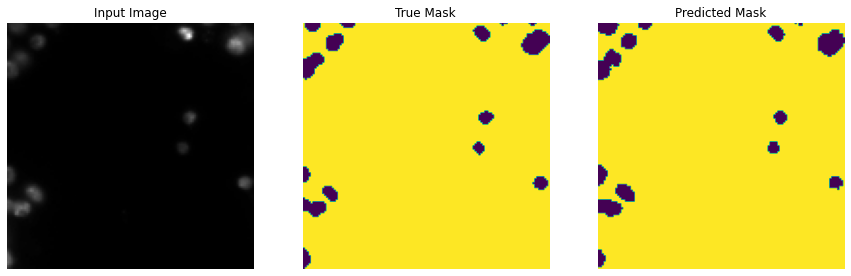

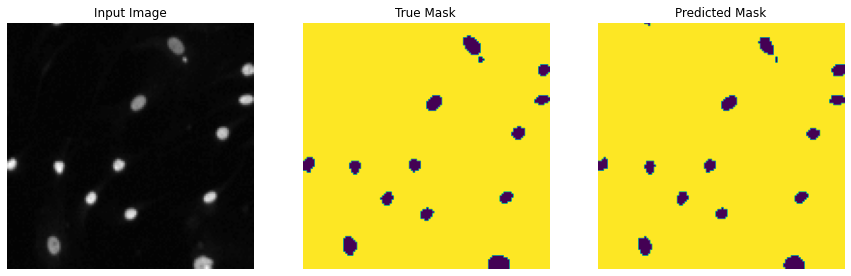


 Sample prediction after epoch 21


Epoch 21: val_accuracy did not improve from 0.96804
30/30 [==============================] - 45s 1s/step - loss: 0.0730 - accuracy: 0.9703 - val_loss: 0.0833 - val_accuracy: 0.9664
Epoch 22/100
30/30 [==============================] - ETA: 0s - loss: 0.0764 - accuracy: 0.9685

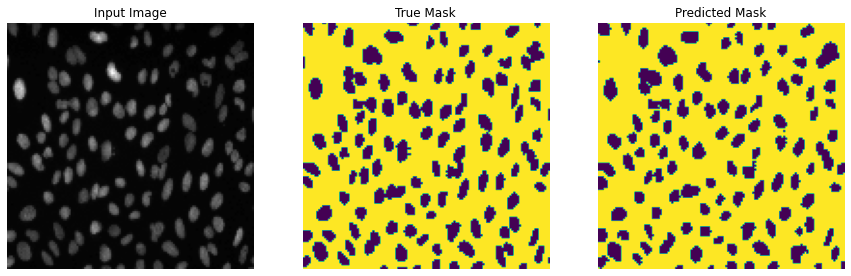

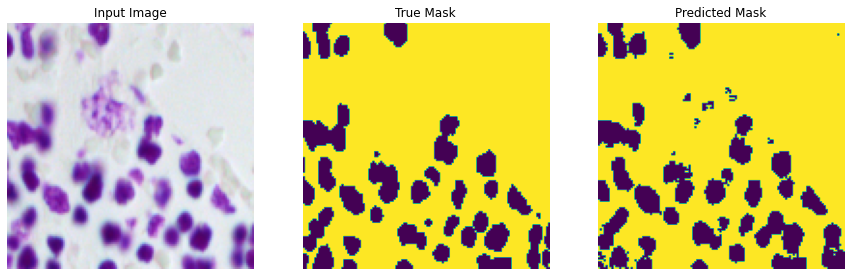


 Sample prediction after epoch 22


Epoch 22: val_accuracy did not improve from 0.96804
30/30 [==============================] - 48s 2s/step - loss: 0.0764 - accuracy: 0.9685 - val_loss: 0.0856 - val_accuracy: 0.9654
Epoch 23/100
30/30 [==============================] - ETA: 0s - loss: 0.0721 - accuracy: 0.9704

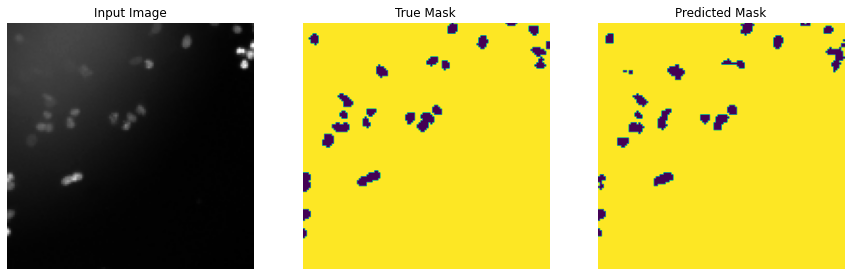

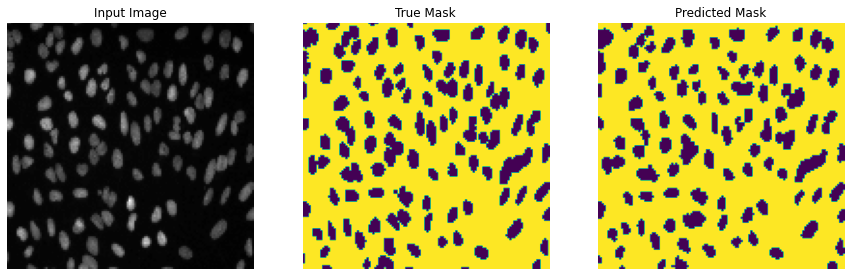


 Sample prediction after epoch 23


Epoch 23: val_accuracy did not improve from 0.96804
30/30 [==============================] - 48s 2s/step - loss: 0.0721 - accuracy: 0.9704 - val_loss: 0.0826 - val_accuracy: 0.9668
Epoch 24/100
30/30 [==============================] - ETA: 0s - loss: 0.0719 - accuracy: 0.9704

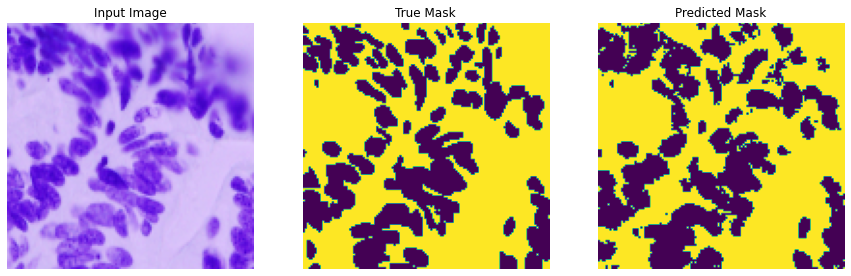

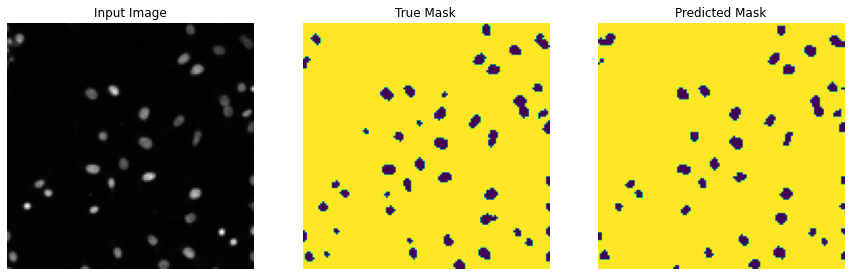


 Sample prediction after epoch 24


Epoch 24: val_accuracy did not improve from 0.96804
30/30 [==============================] - 44s 1s/step - loss: 0.0719 - accuracy: 0.9704 - val_loss: 0.0805 - val_accuracy: 0.9675
Epoch 24: early stopping


In [42]:
history = train_model(model, 100)

# Observe model on Tensorboard

In [47]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

### Upload log to <a href="https://tensorboard.dev/">TensorBoard.dev</a>

In [ ]:
# Upload an experiment to tensorboard dev
! tensorboard dev upload --logdir /content/logs \
    --name "Data Science Bowl 2018_MobileNetv2" \
    --description "MobileNetv2 as base model for image segmentation"

# Deploy model

Show prediction on test set.

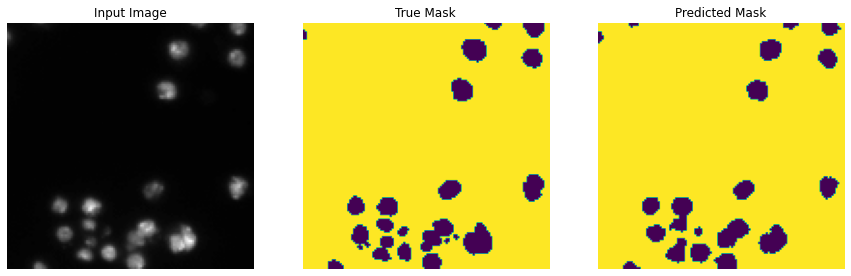

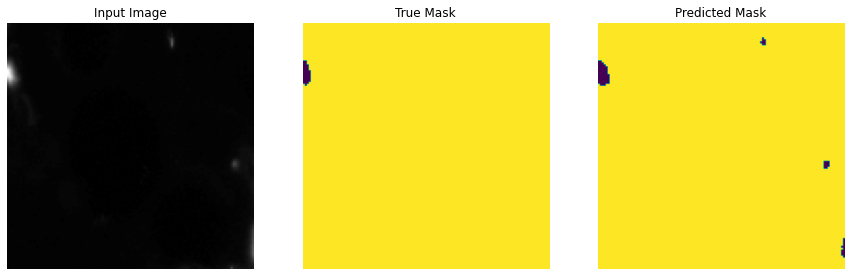

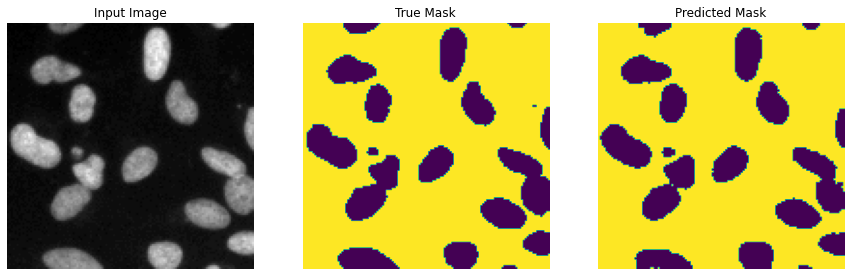

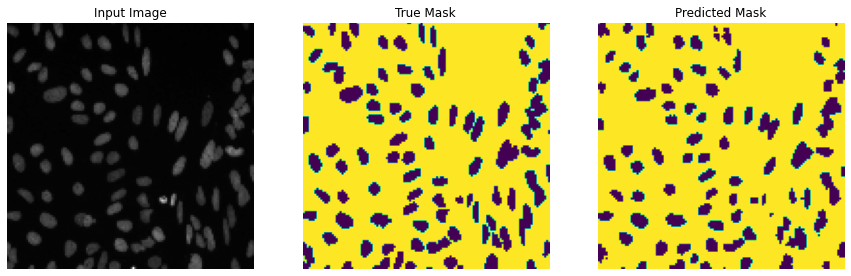

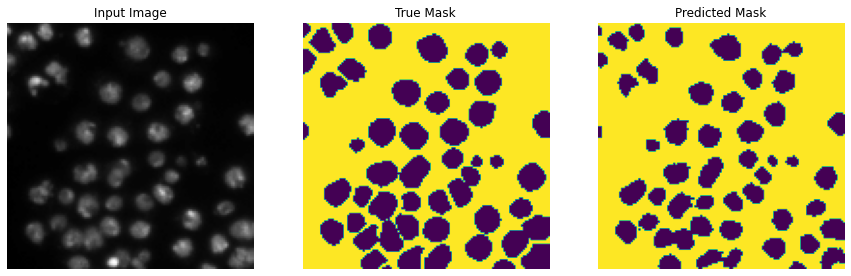

In [53]:
show_predictions(test, 5)